## AI in Enterprise Systems (AIDI - 2004 - 02)

#### <font color='black'>LAB EXERCISE #1 - MACHINE LEARNING : Random Forest Algorithm</font>

**Submitted By : Jugnu Shefin**  
**Student No: 100814025**

**<font>Independent Variables:</font>**  
• id: id number  
• radius_mean  
• texture_mean  
• perimeter_mean  
• area_mean  
• smoothness_mean  
• compactness_mean  
• concavity_mean  
• points_mean  
• symmetry_mean  
• dimension_mean  
• radius_se  
• texture_se  
• perimeter_se  
• area_se  
• smoothness_se  
• compactness_se  
• concavity_se  
• points_se  
• symmetry_se  
• dimension_se  
• radius_worst  
• texture_worst  
• perimeter_worst  
• area_worst  
• smoothness_worst  
• compactness_worst  
• concavity_worst  
• points_worst  
• symmetry_worst  
• dimension_worst  

**<font>Dependent Variable:</font>**   
• diagnosis  

**Note :** The dataset used in this analysis is provided by Professor. The code used is either a direct copy or a modification of the code provided as part of the Artificial Intelligence Analysis, Design and Implementation graduate certificate at Durham College.

### Business Problem Description

Mr.Huges is interested in creating Machine Learning : Random Forest Algorithm using **Breast Cancer** dataset. 

The goal of the analysis is to create Random Forest Algorithm which would be able to use attributes such as id, radius_mean, texture_mean,perimeter_mean, area_mean, smoothness_mean, compactness_mean,  
concavity_mean, points_mean, symmetry_mean, dimension_mean, radius_se, texture_se, and so on to predict breast cancer and evaluate and understand the classification report results such as Precision, F1 score ,recall for these three models.   

**<font color='black'>Importing the libraries</font>**

In [3]:
#Load Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

**<font color='black'>Load the dataset</font>**

In [4]:
#Load the dataset
data = '/content/dataset.csv'

df = pd.read_csv(data)

# preview the dataset
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


### Exploratory Data Analysis

In [5]:
# view dimensions of dataset
df.shape

(569, 32)

In [6]:
#Remove the 'id' column
df = df.drop(['id'], axis = 1)

**We can see that there are 569 instances and 31 variables in the data set.**

In [7]:
#View top 5 rows of dataset
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [8]:
#Description of the dataframe
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


We can see that the dataset does not have proper column names. The columns are merely labelled as 0,1,2.... and so on. I have given proper names to the columns as below -

In [9]:
#unique values of each column
temp=[]
for col in df.columns:
    temp.append([col,df[col].nunique()])
temp=pd.DataFrame(temp,columns=['Columns','No. of Unique'])       
display(temp)

,Columns,No. of Unique
0,diagnosis,2
1,radius_mean,456
2,texture_mean,479
3,perimeter_mean,522
4,area_mean,539
5,smoothness_mean,474
6,compactness_mean,537
7,concavity_mean,537
8,points_mean,542
9,symmetry_mean,432


In [10]:
#View summary of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   diagnosis          569 non-null    object 
 1   radius_mean        569 non-null    float64
 2   texture_mean       569 non-null    float64
 3   perimeter_mean     569 non-null    float64
 4   area_mean          569 non-null    float64
 5   smoothness_mean    569 non-null    float64
 6   compactness_mean   569 non-null    float64
 7   concavity_mean     569 non-null    float64
 8   points_mean        569 non-null    float64
 9   symmetry_mean      569 non-null    float64
 10  dimension_mean     569 non-null    float64
 11  radius_se          569 non-null    float64
 12  texture_se         569 non-null    float64
 13  perimeter_se       569 non-null    float64
 14  area_se            569 non-null    float64
 15  smoothness_se      569 non-null    float64
 16  compactness_se     569 non

In [11]:
#Summary of N/A Values
df.isnull().sum()

diagnosis            0
radius_mean          0
texture_mean         0
perimeter_mean       0
area_mean            0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
perimeter_se         0
area_se              0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
radius_worst         0
texture_worst        0
perimeter_worst      0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

#### Analysis : No null values treatment is required  
#### Data contains 31 variables and 569 records

In [12]:
#Check the data type of each column
df.dtypes

diagnosis             object
radius_mean          float64
texture_mean         float64
perimeter_mean       float64
area_mean            float64
smoothness_mean      float64
compactness_mean     float64
concavity_mean       float64
points_mean          float64
symmetry_mean        float64
dimension_mean       float64
radius_se            float64
texture_se           float64
perimeter_se         float64
area_se              float64
smoothness_se        float64
compactness_se       float64
concavity_se         float64
points_se            float64
symmetry_se          float64
dimension_se         float64
radius_worst         float64
texture_worst        float64
perimeter_worst      float64
area_worst           float64
smoothness_worst     float64
compactness_worst    float64
concavity_worst      float64
points_worst         float64
symmetry_worst       float64
dimension_worst      float64
dtype: object

**Summary of variables**  
There are 31 variables in the dataset. All the variables are numerical.    
diagnosis is the target variable.

Let's explore diagnosis variable

In [13]:
#value count of class
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

The diagnosis target variable is integer in nature.

**Missing values in variables**

In [14]:
# check missing values in variables

df.isnull().sum()

diagnosis            0
radius_mean          0
texture_mean         0
perimeter_mean       0
area_mean            0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
perimeter_se         0
area_se              0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
radius_worst         0
texture_worst        0
perimeter_worst      0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

We can see that there are no missing values in the dataset. I have checked the frequency distribution of values previously. It also confirms that there are no missing values in the dataset.

In [15]:
#Coorelation for all numerical variables in abalone dataset.
df.corr()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,0.679090,-0.097317,0.674172,0.735864,-0.222600,0.206000,0.194204,0.376169,-0.104321,-0.042641,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,0.275869,0.386358,0.281673,0.259845,0.006614,0.191975,0.143293,0.163851,0.009127,0.054458,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,0.691765,-0.086761,0.693135,0.744983,-0.202694,0.250744,0.228082,0.407217,-0.081629,-0.005523,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,0.732562,-0.066280,0.726628,0.800086,-0.166777,0.212583,0.207660,0.372320,-0.072497,-0.019887,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,0.301467,0.068406,0.296092,0.246552,0.332375,0.318943,0.248396,0.380676,0.200774,0.283607,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,0.497473,0.046205,0.548905,0.455653,0.135299,0.738722,0.570517,0.642262,0.229977,0.507318,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,0.631925,0.076218,0.660391,0.617427,0.098564,0.670279,0.691270,0.683260,0.178009,0.449301,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,0.698050,0.021480,0.710650,0.690299,0.027653,0.490424,0.439167,0.615634,0.095351,0.257584,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,0.303379,0.128053,0.313893,0.223970,0.187321,0.421659,0.342627,0.393298,0.449137,0.331786,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
dimension_mean,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,0.000111,0.164174,0.039830,-0.090170,0.401964,0.559837,0.446630,0.341198,0.345007,0.688132,-0.253691,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


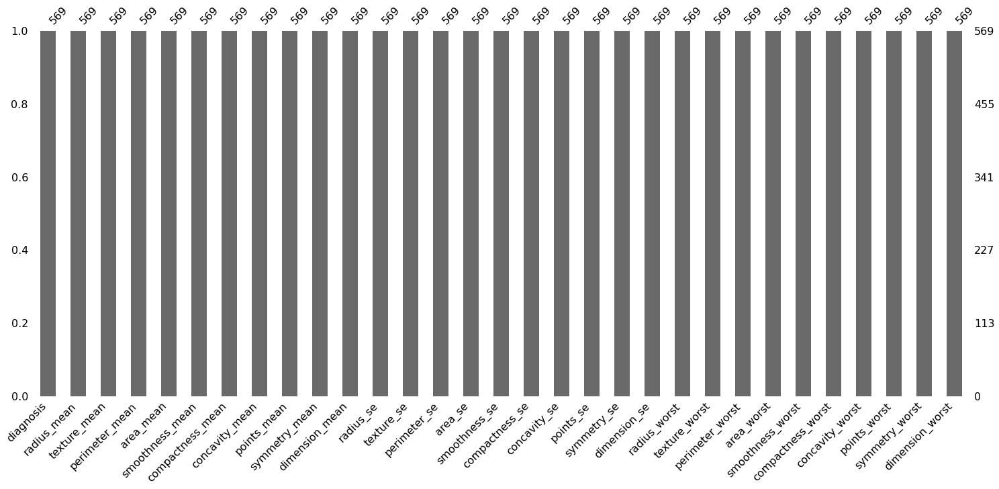

In [16]:
#Shows the datatypes for each column and total number of entries in dataset
import missingno as msno
msno.bar(df)

Number of cells labeled Benign:  357
Number of cells labeled Malignant :  212

% of cells labeled Benign 62.74 %
% of cells labeled Malignant 37.26 %


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


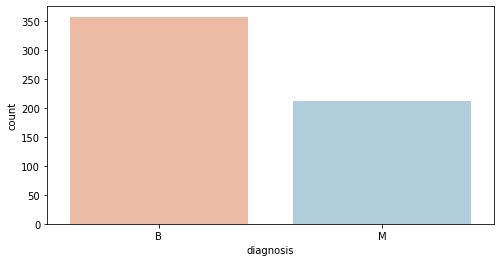

In [17]:
# Visualize distribution of classes 
plt.figure(figsize=(8, 4))
sns.countplot(df['diagnosis'], palette='RdBu')

# count number of obvs in each class
benign, malignant = df['diagnosis'].value_counts()
print('Number of cells labeled Benign: ', benign)
print('Number of cells labeled Malignant : ', malignant)
print('')
print('% of cells labeled Benign', round(benign / len(df) * 100, 2), '%')
print('% of cells labeled Malignant', round(malignant / len(df) * 100, 2), '%')

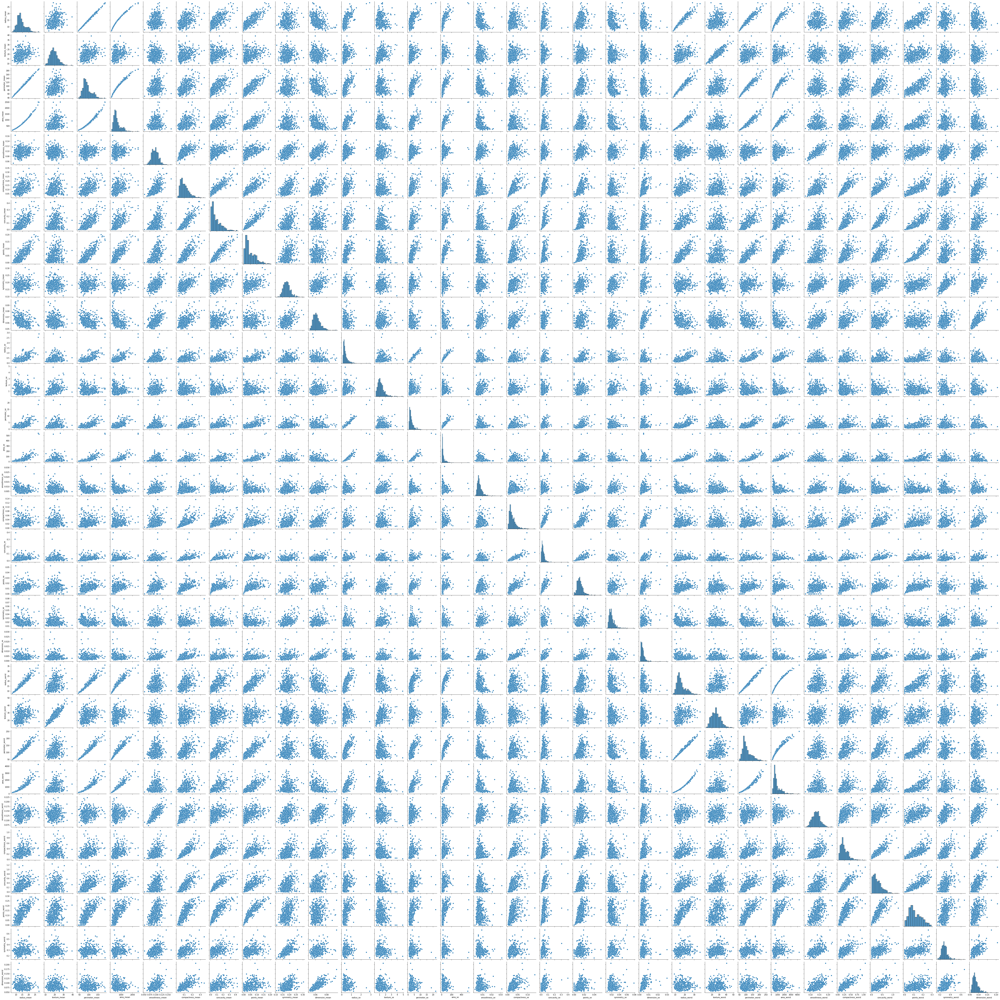

In [18]:
#sns paiplot - It plots the pairwise plot of multiple features/variable in a grid format.
sns.pairplot(df)
plt.savefig('foo.png')

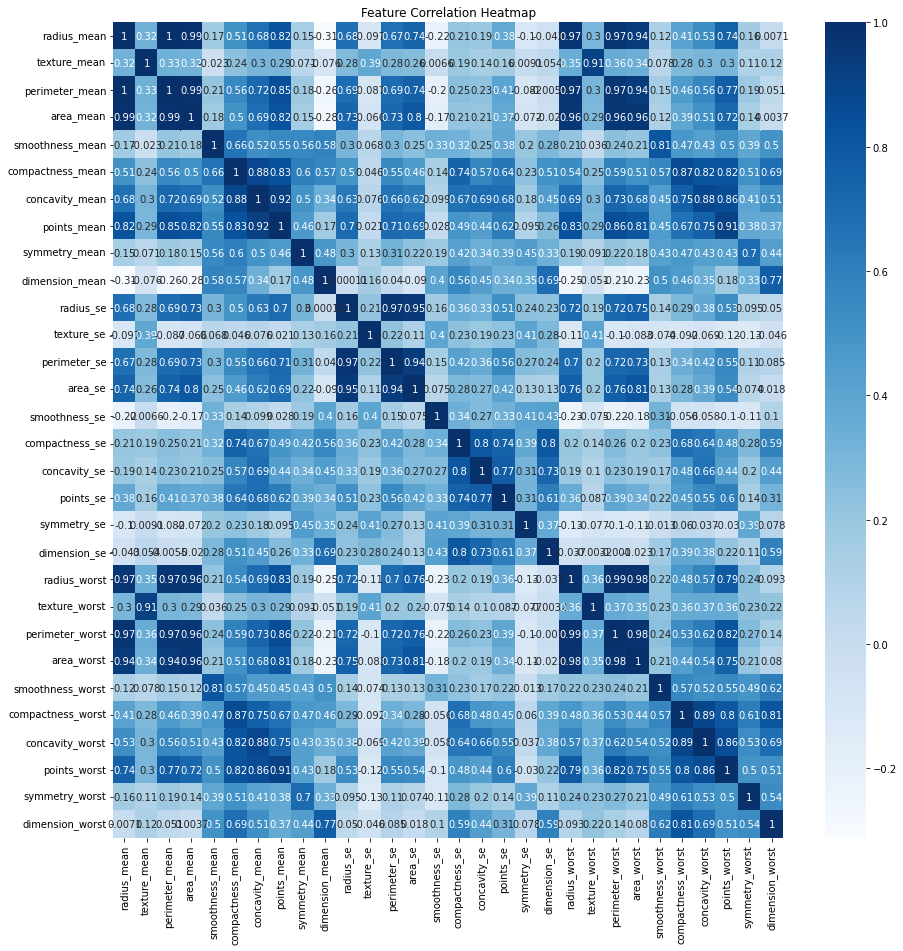

In [19]:
#Visualization of Correlations
fig = plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True,cmap="Blues")
plt.title("Feature Correlation Heatmap")
plt.savefig('heatmap.png')

In [20]:
#Find Independent Column Correlations
def correlation(df,threshold):
    col_corr= [] # List of correlated columns
    corr_matrix=df.corr() #finding correlation between columns
    for i in range (len(corr_matrix.columns)): #Number of columns
        for j in range (i):
            if abs(corr_matrix.iloc[i,j])>threshold: #checking correlation between columns
                colName=(corr_matrix.columns[i], corr_matrix.columns[j]) #getting correlated columns
                col_corr.append(colName) #adding correlated column name
    return col_corr #returning set of column names
col=correlation(df,0.8)
print('Correlated columns @ 0.8:', col)

Correlated columns @ 0.8: [('perimeter_mean', 'radius_mean'), ('area_mean', 'radius_mean'), ('area_mean', 'perimeter_mean'), ('concavity_mean', 'compactness_mean'), ('points_mean', 'radius_mean'), ('points_mean', 'perimeter_mean'), ('points_mean', 'area_mean'), ('points_mean', 'compactness_mean'), ('points_mean', 'concavity_mean'), ('perimeter_se', 'radius_se'), ('area_se', 'area_mean'), ('area_se', 'radius_se'), ('area_se', 'perimeter_se'), ('concavity_se', 'compactness_se'), ('dimension_se', 'compactness_se'), ('radius_worst', 'radius_mean'), ('radius_worst', 'perimeter_mean'), ('radius_worst', 'area_mean'), ('radius_worst', 'points_mean'), ('texture_worst', 'texture_mean'), ('perimeter_worst', 'radius_mean'), ('perimeter_worst', 'perimeter_mean'), ('perimeter_worst', 'area_mean'), ('perimeter_worst', 'points_mean'), ('perimeter_worst', 'radius_worst'), ('area_worst', 'radius_mean'), ('area_worst', 'perimeter_mean'), ('area_worst', 'area_mean'), ('area_worst', 'points_mean'), ('area_

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f96acaa0690>,
      dtype=object)

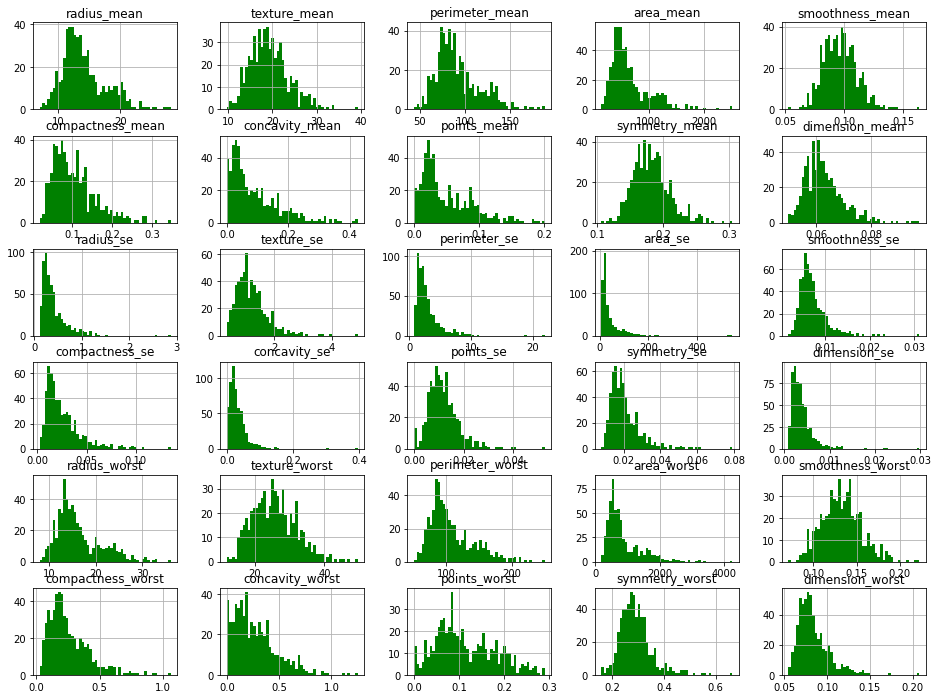

In [21]:
#Histogram
df.hist(bins=50,figsize=(16,12), color="green")

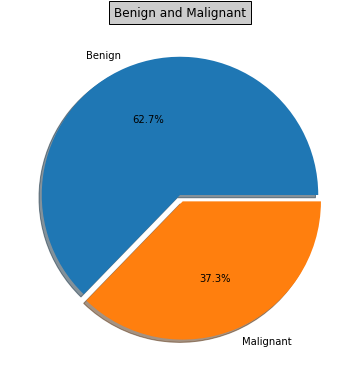

In [22]:
from pylab import figure, axes, pie, title, show

# Make a square figure and axes
figure(1, figsize=(6, 6))
ax = axes([0.1, 0.1, 0.8, 0.8])

labels = 'Benign','Malignant' 
fracs = [62.74, 37.26]

explode = (0, 0.05)
pie(fracs, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True)
title('Benign and Malignant', bbox={'facecolor': '0.8', 'pad': 5})

show() 

**<font>Split into dependent and Independent variables</font>**

In [23]:
# Define x and y variables
X = df.drop(['diagnosis'], axis=1)
y = df['diagnosis']

**<font>Split data into separate training and test set</font>**

In [24]:
# split X and y into training and testing sets

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

**Data Split or Partitioning prior to create a model:**  

**Data partitioning is a technique to train and test the algorithm to differentiate the results, to interpret and proceed to make considerations and changes to the dataset. Hence, if the training data provides a decent prediction results.**  

**Data Standardization is a process of converting data into a standard format irrespective of various variables in the dataset (on a common path).**  

**It helps to establish clear, consistently defined elements and attributes, providing a comprehensive catalog of our data
Therefore, data standardization is essential technique to utilize before proceeding to build any algorithm.
Data partition and percentage of split among train and test dataframe.**  
 
**•	Train data – 70% •	Test data – 30%**

In [25]:
# Check the shape of X_train and X_test

X_train.shape, X_test.shape

((381, 30), (188, 30))

**<font color='blue'>Feature Engineering</font>**

Feature Engineering is the process of transforming raw data into useful features that help us to understand our model better and increase its predictive power. I will carry out feature engineering on different types of variables.  

First, I will check the data types of variables again.

In [26]:
# check data types in X_train

X_train.dtypes

radius_mean          float64
texture_mean         float64
perimeter_mean       float64
area_mean            float64
smoothness_mean      float64
compactness_mean     float64
concavity_mean       float64
points_mean          float64
symmetry_mean        float64
dimension_mean       float64
radius_se            float64
texture_se           float64
perimeter_se         float64
area_se              float64
smoothness_se        float64
compactness_se       float64
concavity_se         float64
points_se            float64
symmetry_se          float64
dimension_se         float64
radius_worst         float64
texture_worst        float64
perimeter_worst      float64
area_worst           float64
smoothness_worst     float64
compactness_worst    float64
concavity_worst      float64
points_worst         float64
symmetry_worst       float64
dimension_worst      float64
dtype: object

In [27]:
#View top 5 rows of X_train 
print(X_train)

     radius_mean  texture_mean  ...  symmetry_worst  dimension_worst
172        13.71         20.83  ...          0.3196          0.11510
407        11.41         10.82  ...          0.3016          0.08523
56         11.74         14.69  ...          0.2604          0.09879
497        13.17         21.81  ...          0.3693          0.09618
301        14.26         18.17  ...          0.2636          0.07676
..           ...           ...  ...             ...              ...
71         10.05         17.53  ...          0.2894          0.07664
106        12.56         19.07  ...          0.2121          0.07188
270        12.80         17.46  ...          0.1988          0.07053
435        14.11         12.88  ...          0.2100          0.07083
102        11.29         13.04  ...          0.2733          0.08022

[381 rows x 30 columns]


We can see that all the variables are ordinal categorical data type.

In [28]:
#View top 5 rows of X_train 
print(X_train)

     radius_mean  texture_mean  ...  symmetry_worst  dimension_worst
172        13.71         20.83  ...          0.3196          0.11510
407        11.41         10.82  ...          0.3016          0.08523
56         11.74         14.69  ...          0.2604          0.09879
497        13.17         21.81  ...          0.3693          0.09618
301        14.26         18.17  ...          0.2636          0.07676
..           ...           ...  ...             ...              ...
71         10.05         17.53  ...          0.2894          0.07664
106        12.56         19.07  ...          0.2121          0.07188
270        12.80         17.46  ...          0.1988          0.07053
435        14.11         12.88  ...          0.2100          0.07083
102        11.29         13.04  ...          0.2733          0.08022

[381 rows x 30 columns]


In [29]:
#View top 5 rows of X_test 
print(X_test)

     radius_mean  texture_mean  ...  symmetry_worst  dimension_worst
204       11.710         15.45  ...          0.2765          0.07806
70        13.480         20.82  ...          0.2807          0.10710
131       13.660         19.13  ...          0.2744          0.08839
431       18.310         20.58  ...          0.3074          0.07863
540       17.010         20.26  ...          0.3275          0.06469
..           ...           ...  ...             ...              ...
141       17.990         10.38  ...          0.4601          0.11890
498       19.550         28.77  ...          0.2818          0.10050
7         13.810         23.75  ...          0.4432          0.10860
541        9.295         13.90  ...          0.3681          0.08982
19        12.190         13.29  ...          0.3469          0.09241

[188 rows x 30 columns]


We now have training and test set ready for model building.

### **<font>Random Forest Algorithm</font>**

#### **<font>Split data into training and testing sets</font>**

In [30]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

In [31]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape

((381, 30), (188, 30))

In [32]:
# import Random Forest classifier

from sklearn.ensemble import RandomForestClassifier

# instantiate the classifier 

rfc = RandomForestClassifier(random_state=0)

In [33]:
# fit the model

rfc.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [34]:
# Predict the Test set results

y_pred = rfc.predict(X_test)

In [35]:
# Check accuracy score 

from sklearn.metrics import accuracy_score

print('Model accuracy score with 10 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.9681


#### CONFUSION MATRIX

In [36]:
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[117   4]
 [  2  65]]


#### CLASSIFICATION REPORT

In [37]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           B       0.98      0.97      0.97       121
           M       0.94      0.97      0.96        67

    accuracy                           0.97       188
   macro avg       0.96      0.97      0.97       188
weighted avg       0.97      0.97      0.97       188



After applying Random Forest Classifier Model, we can observe that the accuracy of the data is 97%. The macro average of precision is 97%. The macro average of recall is 97%. The F1-Score is 97%.

#### Random Forest Classifier model with parameter n_estimators=100 

In [38]:
# instantiate the classifier with n_estimators = 100
rfc_100 = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set
rfc_100.fit(X_train, y_train)

# Predict on the test set results
y_pred_100 = rfc_100.predict(X_test)

In [39]:
# Check accuracy score 
print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred_100)))

Model accuracy score with 100 decision-trees : 0.9681


#### Finding important features with Random Forest model

In [40]:
# create the classifier with n_estimators = 100

clf = RandomForestClassifier(n_estimators=100, random_state=0)

# fit the model to the training set

clf.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [41]:
# view the feature scores

feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

feature_scores

points_worst         0.136851
perimeter_worst      0.123734
points_mean          0.118592
concavity_mean       0.106376
radius_worst         0.074895
area_worst           0.072630
perimeter_mean       0.046276
concavity_worst      0.043698
area_se              0.039887
area_mean            0.030965
radius_mean          0.030149
radius_se            0.018326
compactness_worst    0.017132
perimeter_se         0.014192
texture_mean         0.013980
texture_worst        0.013972
concavity_se         0.012809
smoothness_worst     0.011406
dimension_worst      0.011029
symmetry_worst       0.007935
dimension_se         0.007349
points_se            0.006896
compactness_se       0.006491
texture_se           0.006135
dimension_mean       0.005140
symmetry_se          0.005065
smoothness_se        0.005055
smoothness_mean      0.005053
compactness_mean     0.004421
symmetry_mean        0.003560
dtype: float64

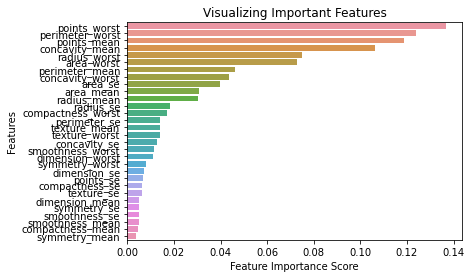

In [42]:
# Creating a seaborn bar plot
sns.barplot(x=feature_scores, y=feature_scores.index)

# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')

# Add title to the graph
plt.title("Visualizing Important Features")

# Visualize the graph
plt.show()

#### Build Random Forest model on selected features 

In [43]:
# declare feature vector and target variable

X = df.drop(['diagnosis', 'symmetry_mean'], axis=1)
y = df['diagnosis']

In [44]:
# split data into training and testing sets

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42)

In [45]:
# instantiate the classifier with n_estimators = 100
clf = RandomForestClassifier(random_state=0)

# fit the model to the training set
clf.fit(X_train, y_train)

# Predict on the test set results
y_pred = clf.predict(X_test)

# instantiate the classifier with n_estimators = 100
clf = RandomForestClassifier(random_state=0)

# fit the model to the training set
clf.fit(X_train, y_train)

# Predict on the test set results
y_pred = clf.predict(X_test)

# Check accuracy score 
print('Model accuracy score with doors variable removed : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with doors variable removed : 0.9681


#### CONFUSION MATRIX

In [46]:
# Print the Confusion Matrix and slice it into four pieces

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', cm)

Confusion matrix

 [[117   4]
 [  2  65]]


#### CLASSIFICATION REPORT

In [47]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           B       0.98      0.97      0.97       121
           M       0.94      0.97      0.96        67

    accuracy                           0.97       188
   macro avg       0.96      0.97      0.97       188
weighted avg       0.97      0.97      0.97       188



### CONCLUSION

In this project, I built Random Forest Model to predict the breast cancer. The model yields a very good performance as indicated by the model accuracy in all three models which was found to be 97%.

We can see that the training-set score and test-set score is same as above. The training-set accuracy score is 0.9738 while the test-set accuracy to be 0.9734. These two values are quite comparable. So, there is no sign of overfitting.

The confusion matrix and classification report yields very good model performance.

### RECOMMENDATIONS

Balance Unbalanced Classes:  
We saw above that unbalanced classes can cause us a few problems. One way to deal with unbalanced classes is to balance them.  
“Over-sampling” takes the smaller class and adds copies of a random selection of its data points until the smaller class is the same size as the larger class.  
“Under-sampling” takes the larger class and removes some data points at random until the larger class is the same size as the smaller class.  
Elimination of Outliers will help the model to be accurate with new incoming data to enhance this algorithm.

**PROS**  
1. These models are easy to interpret and visualize.  
2. It can easily capture Non-linear patterns.  
3. It requires fewer data preprocessing from the user, for example, there is no need to normalize columns.  
4. It can be used for feature engineering such as predicting missing values, suitable for variable selection.  
5. The decision tree has no assumptions about distribution because of the non-parametric nature of the algorithm. 

**CONS**  
1. Sensitive to noisy data. It can overfit noisy data.  
2. The small variation(or variance) in data can result in the different decision tree. This can be reduced by bagging and boosting algorithms.  
3. Decision trees are biased with imbalance dataset, so it is recommended that balance out the dataset before creating the decision tree.  

### REFERENCES

 https://www.kaggle.com/prashant111/random-forest-classifier-tutorial  

Course material provided by Professor on DC Connect.